In [2]:
import pandas as pd
import geopandas as gpd

In [3]:
import numpy as np

In [4]:
from shapely.geometry import Point

In [ ]:
turisticos = gpd.read_file("/home/ec2-user/SageMaker/Untitled Folder/geojson/atractivos_turisticos.geojson")
ecoparques = gpd.read_file("/home/ec2-user/SageMaker/Untitled Folder/geojson/ecoparques.geojson")
ciclorrutas = gpd.read_file("/home/ec2-user/SageMaker/Untitled Folder/geojson/pot48_2014_ciclorrutas.geojson")
zonas_verdes = gpd.read_file("/home/ec2-user/SageMaker/Untitled Folder/geojson/pot48_2014_zonas_verdes_s.geojson")
red_ciclista = gpd.read_file("/home/ec2-user/SageMaker/Untitled Folder/geojson/red_ciclista.geojson")
rio = gpd.read_file("/home/ec2-user/SageMaker/Untitled Folder/geojson/rio_medellin.geojson")



# Ver las primeras filas para verificar que los datos se hayan cargado correctamente
print(turisticos.head())
print(ecoparques.head())
print(ciclorrutas.head())
print(zonas_verdes.head())
print(red_ciclista.head())
print(rio.head())

DriverError: Failed to open dataset (flags=68): /home/ec2-user/SageMaker/Untitled Folder/geojson/atractivos_turisticos.geojson

In [7]:
import folium
import geopandas as gpd

# Asegurarse de que cada GeoDataFrame esté en CRS EPSG:4326
def ensure_crs(gdf):
    if gdf.crs != "EPSG:4326":
        gdf = gdf.to_crs("EPSG:4326")
    return gdf

# Transformar los GeoDataFrames al CRS correcto
turisticos = ensure_crs(turisticos)
ecoparques = ensure_crs(ecoparques)
ciclorrutas = ensure_crs(ciclorrutas)
zonas_verdes = ensure_crs(zonas_verdes)
red_ciclista = ensure_crs(red_ciclista)
rio = ensure_crs(rio)

# Crear el mapa centrado en Medellín
mapa = folium.Map(location=[6.2442, -75.5812], zoom_start=12)

# Función para añadir los datos de un GeoDataFrame como puntos o centroides en el mapa
def add_markers(gdf, color, popup_text):
    for _, row in gdf.iterrows():
        # Verificar que tenga la columna 'geometry'
        if 'geometry' in gdf.columns:
            geom = row.geometry
            # Usar el centroide si la geometría no es un punto
            if geom.geom_type != "Point":
                geom = geom.centroid
            folium.Marker(
                location=[geom.y, geom.x],
                popup=popup_text,
                icon=folium.Icon(color=color)
            ).add_to(mapa)

# Añadir cada capa al mapa
add_markers(turisticos, "blue", "Atractivo Turístico")
add_markers(ecoparques, "green", "Ecoparque")
add_markers(ciclorrutas, "red", "Ciclorrutas")
add_markers(zonas_verdes, "orange", "Zonas Verdes")
add_markers(red_ciclista, "cadetblue", "Red Ciclista")
add_markers(rio, "darkblue", "Río Medellín")

# Mostrar el mapa interactivo
mapa


NameError: name 'turisticos' is not defined

In [13]:
mapa.save('mapa1.html')

/tmp/ipykernel_112861/4013298043.py:38: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


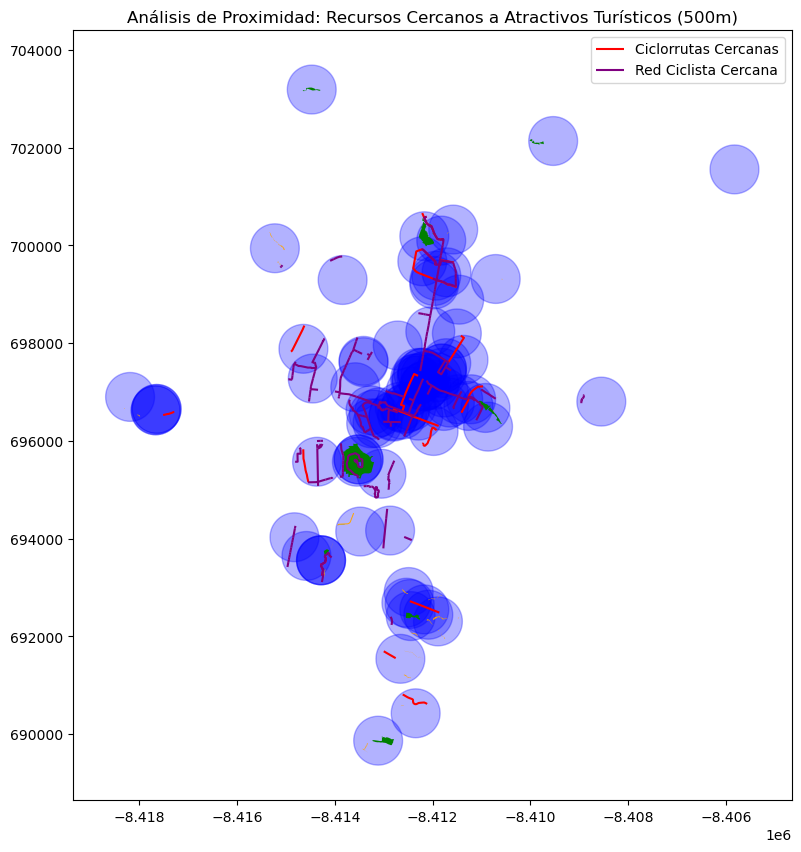

In [14]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Paso 1: Definir el radio del buffer (ej. 500 metros)
buffer_distance = 500  # en metros

# Asegurarse de que los datos están en el sistema de coordenadas adecuado (por ejemplo, UTM) para medir en metros
# Si los datos están en EPSG:4326 (lat/lon), los transformamos a un CRS métrico (por ejemplo, EPSG:3857)
turisticos = turisticos.to_crs(epsg=3857)
ecoparques = ecoparques.to_crs(epsg=3857)
ciclorrutas = ciclorrutas.to_crs(epsg=3857)
zonas_verdes = zonas_verdes.to_crs(epsg=3857)
red_ciclista = red_ciclista.to_crs(epsg=3857)

# Paso 2: Crear el buffer alrededor de los atractivos turísticos
turisticos['buffer'] = turisticos.geometry.buffer(buffer_distance)

# Paso 3: Verificar la intersección con otros puntos de interés
# Filtrar los puntos que están dentro de los buffers
ecoparques_near = ecoparques[ecoparques.geometry.apply(lambda x: turisticos['buffer'].apply(lambda buf: buf.contains(x)).any())]
ciclorrutas_near = ciclorrutas[ciclorrutas.geometry.apply(lambda x: turisticos['buffer'].apply(lambda buf: buf.contains(x)).any())]
zonas_verdes_near = zonas_verdes[zonas_verdes.geometry.apply(lambda x: turisticos['buffer'].apply(lambda buf: buf.contains(x)).any())]
red_ciclista_near = red_ciclista[red_ciclista.geometry.apply(lambda x: turisticos['buffer'].apply(lambda buf: buf.contains(x)).any())]

# Paso 4: Visualizar los resultados en un mapa
fig, ax = plt.subplots(figsize=(10, 10))

# Mostrar el buffer de los atractivos turísticos
turisticos['buffer'].plot(ax=ax, color='blue', alpha=0.3, edgecolor='blue', label='Buffer Atractivos Turísticos')

# Mostrar los puntos de interés dentro del buffer
ecoparques_near.plot(ax=ax, color='green', marker='o', label='Ecoparques Cercanos')
ciclorrutas_near.plot(ax=ax, color='red', marker='o', label='Ciclorrutas Cercanas')
zonas_verdes_near.plot(ax=ax, color='orange', marker='o', label='Zonas Verdes Cercanas')
red_ciclista_near.plot(ax=ax, color='purple', marker='o', label='Red Ciclista Cercana')

# Configurar leyenda y título
plt.legend()
plt.title(f'Análisis de Proximidad: Recursos Cercanos a Atractivos Turísticos ({buffer_distance}m)')
plt.show()


In [17]:
pip install mpld3

Note: you may need to restart the kernel to use updated packages.


In [18]:
import mpld3

/tmp/ipykernel_112861/4033204975.py:14: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


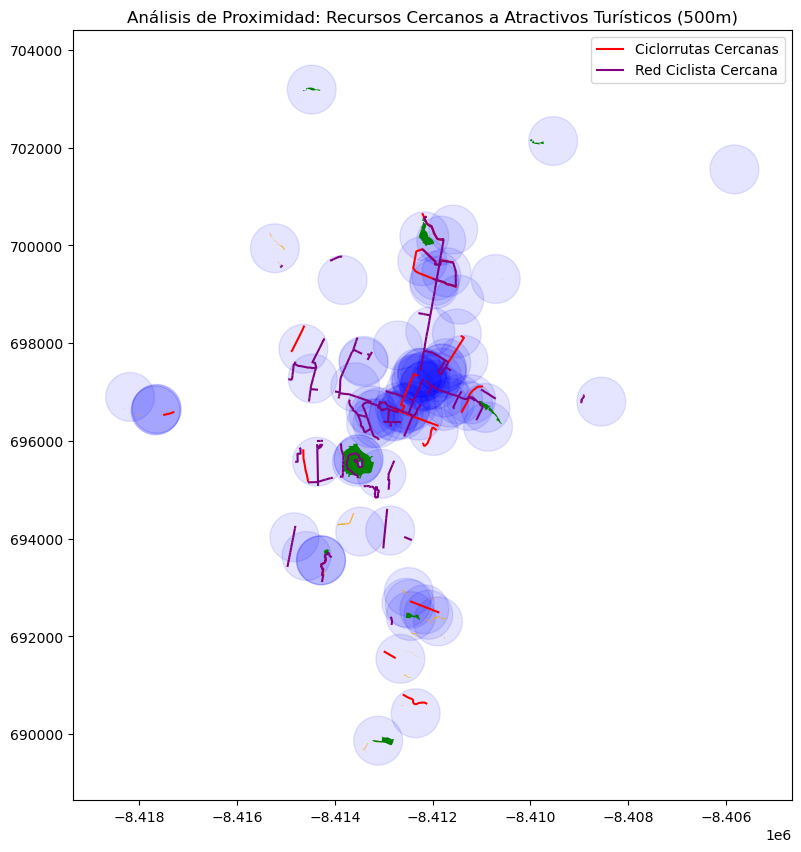

In [19]:
# Visualización con ajustes en transparencia
fig, ax = plt.subplots(figsize=(10, 10))

# Mostrar el buffer de los atractivos turísticos con mayor transparencia
turisticos['buffer'].plot(ax=ax, color='blue', alpha=0.1, edgecolor='blue', label='Buffer Atractivos Turísticos')

# Mostrar los puntos de interés dentro del buffer
ecoparques_near.plot(ax=ax, color='green', marker='o', label='Ecoparques Cercanos')
ciclorrutas_near.plot(ax=ax, color='red', marker='o', label='Ciclorrutas Cercanas')
zonas_verdes_near.plot(ax=ax, color='orange', marker='o', label='Zonas Verdes Cercanas')
red_ciclista_near.plot(ax=ax, color='purple', marker='o', label='Red Ciclista Cercana')

# Configurar leyenda y título
plt.legend()
plt.title(f'Análisis de Proximidad: Recursos Cercanos a Atractivos Turísticos ({buffer_distance}m)')
plt.show()


In [20]:
html_path = "viz_turisticos.html"
mpld3.save_html(fig, html_path)

/home/ec2-user/anaconda3/envs/tensorflow2_p310/lib/python3.10/site-packages/mpld3/mplexporter/utils.py:361: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()



### Observaciones y Posibles Conclusiones

1. **Distribución de Recursos Cercanos a Atractivos Turísticos**:
   - Los círculos azules representan los buffers (áreas de influencia) alrededor de los atractivos turísticos, y dentro de ellos podemos ver diferentes tipos de recursos (ciclovías, ecoparques, zonas verdes, red ciclista).
   - La presencia de varios recursos dentro de los buffers indica una **buena disponibilidad de infraestructuras de ecoturismo** en las proximidades de los atractivos, lo cual es favorable para el turismo sostenible.
  
2. **Concentración de Recursos en Áreas Específicas**:
   - Observamos una concentración de recursos en ciertas áreas, especialmente en el centro del gráfico.
   - Esto sugiere que **algunas áreas son más accesibles** en términos de infraestructura ecoturística, mientras que otras podrían carecer de recursos cercanos.
   - Podrías investigar si esta concentración corresponde a zonas urbanas o puntos clave de ecoturismo, lo que podría orientar decisiones de planificación.

3. **Infraestructura de Ciclovías y Red Ciclista**:
   - Las ciclovías (en rojo) y la red ciclista (en púrpura) están presentes en varios de los buffers, lo que facilita opciones de transporte sostenible.
   - Sin embargo, algunas áreas muestran menos conectividad de ciclovías, lo que podría ser una oportunidad para mejorar la infraestructura ciclista en esas zonas para promover un acceso más sostenible.

4. **Accesibilidad a Espacios Verdes y Ecoparques**:
   - Los ecoparques (en verde) y las zonas verdes (en naranja) están presentes en algunos de los buffers, lo cual es positivo para la experiencia de ecoturismo, ya que los turistas tienen acceso a estos espacios.
   - Áreas con pocos espacios verdes cercanos podrían beneficiarse de una mayor integración de estos recursos, especialmente si se trata de zonas de alto tráfico turístico.

### Recomendaciones para Ecoturismo Sostenible

1. **Mejorar la Conectividad de la Red Ciclista**:
   - En áreas donde las ciclovías y la red ciclista están ausentes o son menos frecuentes, se podría considerar una expansión de esta infraestructura para hacer el ecoturismo más accesible y reducir la dependencia de vehículos motorizados.

2. **Ampliar la Cobertura de Espacios Verdes y Ecoparques**:
   - Las áreas donde los buffers no incluyen ecoparques o zonas verdes podrían beneficiarse de proyectos de revitalización urbana o creación de espacios verdes, lo cual mejoraría la sostenibilidad de la zona y la experiencia del turista.

3. **Distribuir el Tráfico Turístico**:
   - La alta concentración de recursos en algunas zonas podría llevar a la saturación de esas áreas, afectando la experiencia turística y posiblemente el entorno. Crear atractivos en áreas menos concurridas podría distribuir el tráfico turístico de manera más equilibrada.

Este análisis te proporciona una base para tomar decisiones estratégicas de desarrollo e inversión en infraestructura de ecoturismo en la región, con el objetivo de mejorar la sostenibilidad y la accesibilidad en las áreas de interés.

/tmp/ipykernel_112861/3231234792.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cobertura_verde = zonas_verdes.append(ecoparques)
/tmp/ipykernel_112861/3231234792.py:21: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  lambda buf: cobertura_verde.intersection(buf).unary_union.area
/tmp/ipykernel_112861/3231234792.py:44: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()
/tmp/ipykernel_112861/3231234792.py:44: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


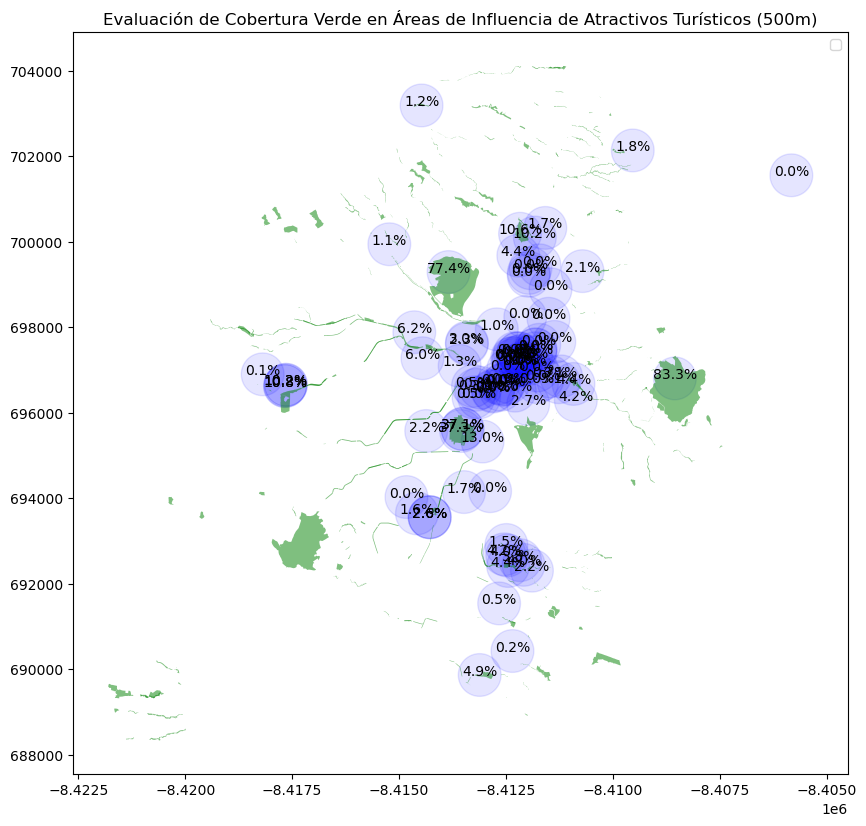

In [21]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Paso 1: Definir el radio del buffer (ej. 500 metros)
buffer_distance = 500  # en metros

# Asegurarse de que los datos están en un sistema de coordenadas adecuado para medir en metros
turisticos = turisticos.to_crs(epsg=3857)
zonas_verdes = zonas_verdes.to_crs(epsg=3857)
ecoparques = ecoparques.to_crs(epsg=3857)

# Crear un GeoDataFrame combinado de todas las áreas verdes
cobertura_verde = zonas_verdes.append(ecoparques)

# Paso 2: Crear el buffer alrededor de los atractivos turísticos
turisticos['buffer'] = turisticos.geometry.buffer(buffer_distance)

# Paso 3: Intersección de Cobertura Verde con los Buffers de Atractivos Turísticos
# Calcular la intersección entre el buffer y las áreas verdes
turisticos['green_coverage'] = turisticos['buffer'].apply(
    lambda buf: cobertura_verde.intersection(buf).unary_union.area
)

# Paso 4: Calcular el porcentaje de cobertura verde en cada buffer
turisticos['buffer_area'] = turisticos['buffer'].area
turisticos['green_coverage_percentage'] = (turisticos['green_coverage'] / turisticos['buffer_area']) * 100

# Visualización de los resultados
fig, ax = plt.subplots(figsize=(10, 10))

# Mostrar el buffer de los atractivos turísticos
turisticos['buffer'].plot(ax=ax, color='blue', alpha=0.1, edgecolor='blue', label='Buffer Atractivos Turísticos')

# Mostrar las áreas verdes
cobertura_verde.plot(ax=ax, color='green', alpha=0.5, label='Cobertura Verde')

# Agregar etiquetas con el porcentaje de cobertura verde
for idx, row in turisticos.iterrows():
    ax.annotate(f"{row['green_coverage_percentage']:.1f}%", 
                xy=(row.geometry.centroid.x, row.geometry.centroid.y), 
                ha="center", color='black')

# Configurar leyenda y título
plt.legend()
plt.title(f'Evaluación de Cobertura Verde en Áreas de Influencia de Atractivos Turísticos ({buffer_distance}m)')
plt.show()


Para realizar una **evaluación de cobertura verde** en el contexto de ecoturismo sostenible, vamos a analizar la relación espacial entre los atractivos turísticos y las áreas de cobertura verde, como **zonas verdes** y **ecoparques**. Esto nos ayudará a entender si los atractivos turísticos están rodeados de áreas verdes y en qué medida, lo cual es fundamental para promover un entorno natural saludable y atractivo para el ecoturismo.

### Pasos para la Evaluación de Cobertura Verde

1. **Definir el Área de Evaluación**: Al igual que en el análisis de proximidad, crearemos un buffer alrededor de los atractivos turísticos para definir un área de influencia, por ejemplo, 500 metros.
2. **Intersección de Cobertura Verde**: Calcularemos la intersección entre las áreas verdes (zonas verdes y ecoparques) y los buffers de los atractivos turísticos para medir la cantidad de cobertura verde en cada área de influencia.
3. **Cálculo del Porcentaje de Cobertura Verde**: Calcularemos el porcentaje de área verde en relación con el área total del buffer alrededor de cada atractivo turístico.

Voy a proporcionarte el código para implementar este análisis.

### Explicación del Código

- **Buffer**: Creamos un buffer de 500 metros alrededor de cada atractivo turístico.
- **Intersección de Cobertura Verde**: Usamos la intersección para calcular el área de las zonas verdes que caen dentro del buffer de cada atractivo.
- **Porcentaje de Cobertura Verde**: Dividimos el área de cobertura verde por el área total del buffer para obtener el porcentaje de cobertura verde.
- **Visualización**: Mostramos el buffer y las áreas de cobertura verde en el mapa, y agregamos etiquetas para cada buffer con el porcentaje de cobertura verde.

### Resultados Esperados

El mapa resultante mostrará:
- **Áreas Verdes (en verde)** que se superponen con los buffers de los atractivos turísticos.
- **Buffers de Atractivos Turísticos (en azul)** para definir el área de influencia de cada atractivo.
- **Porcentaje de Cobertura Verde** en cada buffer, lo cual indicará qué tan "verde" es el entorno alrededor de cada atractivo turístico.

Este análisis te permitirá identificar los atractivos que tienen buena cobertura verde y aquellos que podrían beneficiarse de un mayor desarrollo de áreas verdes para mejorar la experiencia del ecoturismo. Prueba el código y dime si necesitas ayuda con la interpretación o ajustes adicionales.

A partir del gráfico de cobertura verde, se pueden hacer varias observaciones y conclusiones relacionadas con la disponibilidad de áreas verdes alrededor de los atractivos turísticos:

### Observaciones y Conclusiones

1. **Variación en la Cobertura Verde entre Atractivos**:
   - Varios atractivos turísticos tienen un **porcentaje bajo o nulo de cobertura verde** dentro de sus áreas de influencia (buffers), como se observa en el centro del gráfico, donde los valores son muy bajos o cercanos al 0%.
   - Esto sugiere que en estas áreas el entorno es más urbano o tiene poca presencia de espacios naturales, lo cual podría afectar la experiencia del ecoturismo.

2. **Zonas con Alta Cobertura Verde**:
   - Algunas áreas presentan porcentajes de cobertura verde altos, como el buffer con un **83.3%** en el extremo derecho y otros valores elevados dispersos en el mapa. Estos puntos indican que estos atractivos están rodeados de espacios naturales significativos.
   - Los atractivos en estas áreas pueden ofrecer una experiencia de ecoturismo más rica y alineada con un entorno natural, lo cual es favorable para promover prácticas sostenibles.

3. **Distribución de las Áreas Verdes**:
   - Las áreas verdes (en color verde) están distribuidas de forma dispersa y no cubren uniformemente todos los atractivos turísticos. Esta falta de uniformidad sugiere que algunas zonas urbanas no están integradas con suficiente infraestructura verde.
   - Los atractivos cercanos a áreas sin cobertura verde podrían beneficiarse de proyectos de restauración ambiental o la creación de nuevos espacios verdes.

4. **Impacto en la Sostenibilidad del Ecoturismo**:
   - Los atractivos con baja o nula cobertura verde pueden enfrentar desafíos para atraer turistas interesados en ecoturismo. Para promover una experiencia más sostenible y atractiva, se podrían implementar políticas para aumentar las áreas verdes en esas zonas.
   - Zonas con alta cobertura verde representan una oportunidad para concentrar actividades de ecoturismo, reduciendo el impacto en áreas menos verdes y ofreciendo una mejor experiencia para los visitantes.

### Recomendaciones para Mejorar la Cobertura Verde

1. **Mejorar la Integración de Áreas Verdes en Zonas Urbanas**:
   - En las áreas con baja o nula cobertura verde, se podrían implementar proyectos de infraestructura verde, como parques urbanos, corredores ecológicos o jardines verticales, para mejorar la experiencia del visitante.

2. **Fomentar Actividades de Ecoturismo en Áreas con Alta Cobertura Verde**:
   - Las áreas que ya tienen un alto porcentaje de cobertura verde pueden servir como centros clave para el ecoturismo, atrayendo a los visitantes y evitando la presión sobre áreas más urbanizadas.

3. **Monitoreo de la Capacidad de Carga en Áreas Verdes**:
   - Las zonas con alta cobertura verde pueden experimentar saturación si reciben demasiados turistas. Es importante establecer límites de visitantes o implementar rutas controladas para preservar el entorno natural.

Este análisis ayuda a identificar áreas donde se necesita mejorar la infraestructura verde para apoyar el ecoturismo y ofrece información útil para tomar decisiones estratégicas en la planificación urbana y de conservación.

# Análisis de conectividad

/tmp/ipykernel_112861/3913029875.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  rutas_ciclistas = ciclorrutas.append(red_ciclista)
/tmp/ipykernel_112861/3913029875.py:54: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


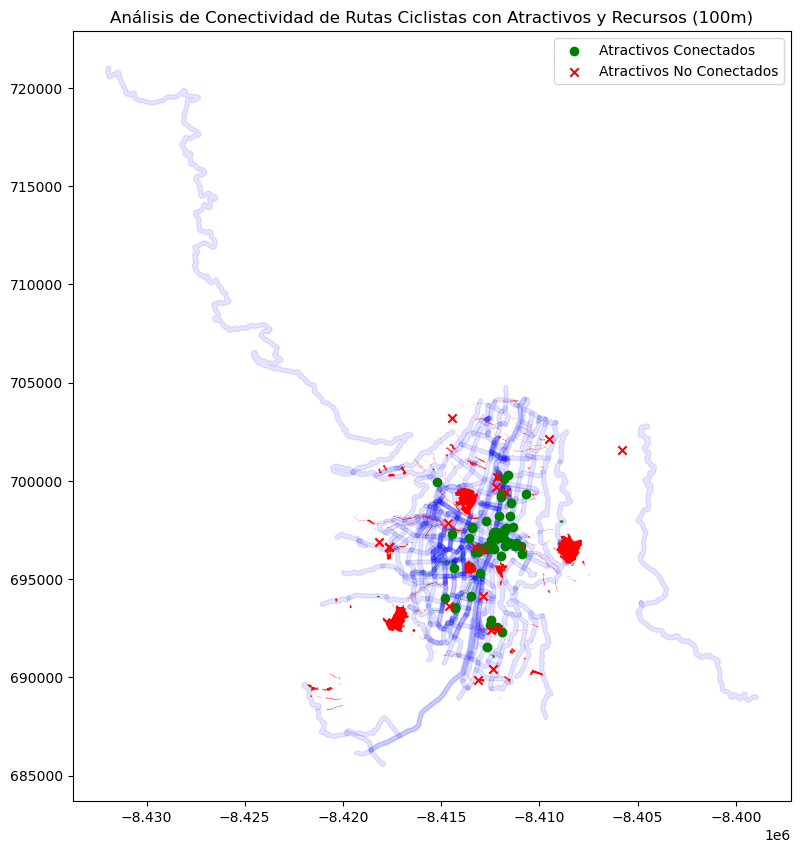

In [22]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Paso 1: Definir el radio del buffer para las rutas ciclistas (ej. 100 metros)
buffer_distance = 100  # en metros

# Asegurarse de que los datos están en un sistema de coordenadas adecuado para medir en metros
ciclorrutas = ciclorrutas.to_crs(epsg=3857)
red_ciclista = red_ciclista.to_crs(epsg=3857)
turisticos = turisticos.to_crs(epsg=3857)
ecoparques = ecoparques.to_crs(epsg=3857)
zonas_verdes = zonas_verdes.to_crs(epsg=3857)

# Crear un GeoDataFrame combinado de todas las rutas ciclistas
rutas_ciclistas = ciclorrutas.append(red_ciclista)

# Paso 2: Crear buffers alrededor de las rutas ciclistas
rutas_ciclistas['buffer'] = rutas_ciclistas.geometry.buffer(buffer_distance)

# Paso 3: Verificar intersección de los buffers de rutas ciclistas con atractivos y recursos
turisticos['connected_to_cycling'] = turisticos.geometry.apply(
    lambda x: rutas_ciclistas['buffer'].apply(lambda buf: buf.contains(x)).any()
)
ecoparques['connected_to_cycling'] = ecoparques.geometry.apply(
    lambda x: rutas_ciclistas['buffer'].apply(lambda buf: buf.contains(x)).any()
)
zonas_verdes['connected_to_cycling'] = zonas_verdes.geometry.apply(
    lambda x: rutas_ciclistas['buffer'].apply(lambda buf: buf.contains(x)).any()
)

# Filtrar los puntos conectados y desconectados
turisticos_connected = turisticos[turisticos['connected_to_cycling']]
turisticos_disconnected = turisticos[~turisticos['connected_to_cycling']]
ecoparques_connected = ecoparques[ecoparques['connected_to_cycling']]
ecoparques_disconnected = ecoparques[~ecoparques['connected_to_cycling']]
zonas_verdes_connected = zonas_verdes[zonas_verdes['connected_to_cycling']]
zonas_verdes_disconnected = zonas_verdes[~zonas_verdes['connected_to_cycling']]

# Visualización de los resultados en un mapa
fig, ax = plt.subplots(figsize=(10, 10))

# Mostrar las rutas ciclistas y sus áreas de influencia (buffers)
rutas_ciclistas['buffer'].plot(ax=ax, color='blue', alpha=0.1, edgecolor='blue', label='Buffer Rutas Ciclistas')

# Mostrar los puntos de interés conectados y desconectados
turisticos_connected.plot(ax=ax, color='green', marker='o', label='Atractivos Conectados')
turisticos_disconnected.plot(ax=ax, color='red', marker='x', label='Atractivos No Conectados')
ecoparques_connected.plot(ax=ax, color='green', marker='^', label='Ecoparques Conectados')
ecoparques_disconnected.plot(ax=ax, color='red', marker='^', label='Ecoparques No Conectados')
zonas_verdes_connected.plot(ax=ax, color='green', marker='s', label='Zonas Verdes Conectadas')
zonas_verdes_disconnected.plot(ax=ax, color='red', marker='s', label='Zonas Verdes No Conectadas')

# Configurar leyenda y título
plt.legend()
plt.title(f'Análisis de Conectividad de Rutas Ciclistas con Atractivos y Recursos ({buffer_distance}m)')
plt.show()


A partir del gráfico de **conectividad de rutas ciclistas con atractivos turísticos y recursos ecoturísticos**, puedes extraer varias conclusiones relacionadas con la accesibilidad en bicicleta de los puntos de interés.

### Conclusiones del Análisis de Conectividad

1. **Buena Conectividad en el Centro**:
   - Los puntos verdes indican **atractivos turísticos y recursos ecoturísticos conectados** a la infraestructura ciclista. La alta concentración de puntos verdes en el área central muestra que los atractivos en esta zona tienen **buena conectividad** con las rutas ciclistas.
   - Esto es favorable para el ecoturismo sostenible, ya que los turistas pueden llegar a estos lugares en bicicleta, reduciendo la necesidad de transporte motorizado.

2. **Atractivos y Recursos Desconectados en las Periferias**:
   - Los puntos rojos (desconectados) están principalmente en las zonas periféricas del mapa, lo que indica que **algunos atractivos y recursos están fuera del alcance de las rutas ciclistas**.
   - Esto podría limitar el acceso sostenible a estos lugares y sugiere la necesidad de ampliar la infraestructura ciclista hacia estas áreas para mejorar la conectividad.

3. **Infraestructura Ciclista Extensa pero Incompleta**:
   - Aunque hay una buena cobertura de rutas ciclistas en el área central, las conexiones hacia las áreas periféricas son limitadas.
   - La expansión de la red ciclista hacia estas zonas podría mejorar la accesibilidad de los recursos ecoturísticos, especialmente si se implementan rutas que conecten las áreas más alejadas.

4. **Oportunidades para el Desarrollo del Ecoturismo**:
   - Los ecoparques y zonas verdes conectados en el centro pueden servir como puntos de interés principales para el ecoturismo, fomentando el uso de la bicicleta.
   - Los atractivos y recursos desconectados (en rojo) en la periferia representan **áreas de oportunidad**. La ampliación de las rutas ciclistas hacia estas zonas no solo mejoraría la accesibilidad, sino que también podría atraer más visitantes, distribuyendo mejor el tráfico turístico.

### Recomendaciones

1. **Ampliar la Red Ciclista hacia las Periferias**:
   - Considera expandir la infraestructura de rutas ciclistas hacia los puntos desconectados para mejorar el acceso a estos recursos y atractivos turísticos.

2. **Fomentar el Uso de la Bicicleta en Áreas Conectadas**:
   - En las áreas donde la conectividad ciclista es buena, se podrían implementar campañas para fomentar el uso de la bicicleta entre los turistas. Esto no solo es más sostenible, sino que también puede mejorar la experiencia del visitante.

3. **Evaluar la Capacidad de Carga en Áreas Conectadas**:
   - La concentración de atractivos conectados en el centro sugiere que estos puntos podrían atraer una gran cantidad de visitantes. Considera estrategias para manejar el tráfico turístico en estas áreas y evitar la saturación.

Este análisis te proporciona una base para tomar decisiones estratégicas en cuanto a la infraestructura de rutas ciclistas, con el objetivo de fomentar un acceso más sostenible y mejorar la experiencia de los turistas en el contexto del ecoturismo.

/tmp/ipykernel_112861/4119246053.py:37: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


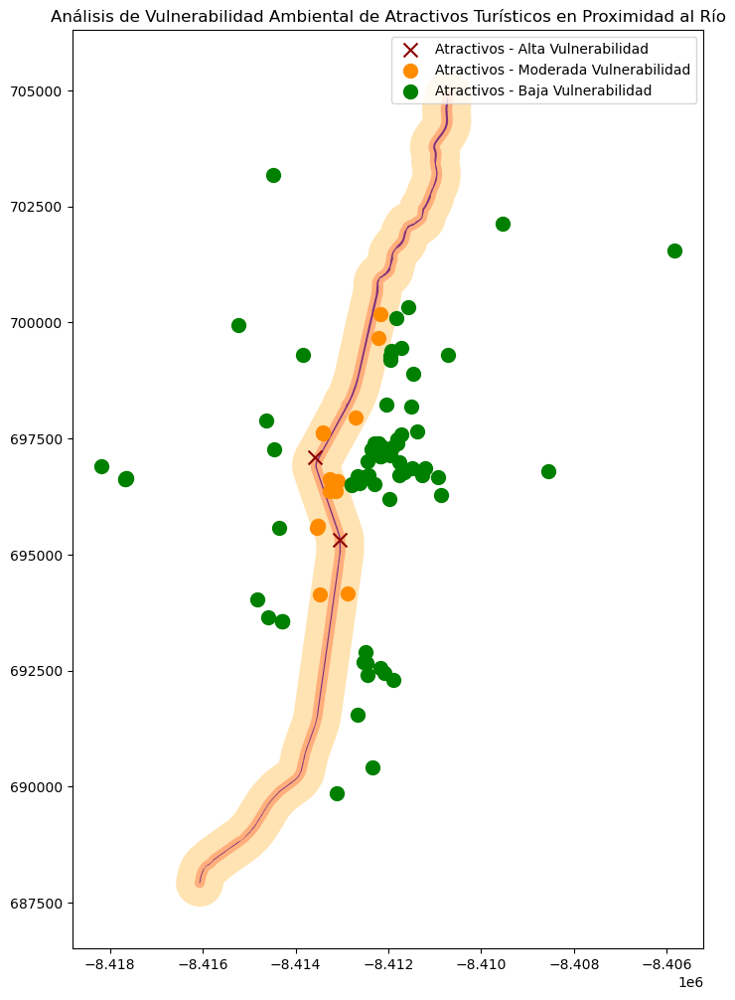

In [23]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Paso 1: Definir el tamaño de los buffers para la vulnerabilidad (ej. 100 y 500 metros)
buffer_distances = [100, 500]  # en metros

# Asegurarse de que los datos están en un sistema de coordenadas adecuado para medir en metros
turisticos = turisticos.to_crs(epsg=3857)
rio = rio.to_crs(epsg=3857)

# Paso 2: Crear buffers alrededor del río
# Crear buffers de 100 m y 500 m para definir áreas de alta y moderada vulnerabilidad
rio['buffer_100m'] = rio.geometry.buffer(buffer_distances[0])
rio['buffer_500m'] = rio.geometry.buffer(buffer_distances[1])

# Paso 3: Evaluar la proximidad de atractivos turísticos y recursos a las áreas sensibles (río)
# Identificar los atractivos dentro de los buffers de 100 m (alta vulnerabilidad) y 500 m (moderada vulnerabilidad)
turisticos['vulnerabilidad'] = turisticos.geometry.apply(
    lambda x: 'Alta' if rio['buffer_100m'].apply(lambda buf: buf.contains(x)).any() else
              ('Moderada' if rio['buffer_500m'].apply(lambda buf: buf.contains(x)).any() else 'Baja')
)

# Paso 4: Visualización de los resultados en un mapa
fig, ax = plt.subplots(figsize=(12, 12))

# Mostrar el río y sus áreas de vulnerabilidad (buffers)
rio.plot(ax=ax, color='blue', label='Río')
rio['buffer_100m'].plot(ax=ax, color='red', alpha=0.3, label='Buffer 100m (Alta Vulnerabilidad)')
rio['buffer_500m'].plot(ax=ax, color='orange', alpha=0.3, label='Buffer 500m (Moderada Vulnerabilidad)')

# Mostrar los atractivos turísticos clasificados por nivel de vulnerabilidad
turisticos[turisticos['vulnerabilidad'] == 'Alta'].plot(ax=ax, color='darkred', marker='x', markersize=100, label='Atractivos - Alta Vulnerabilidad')
turisticos[turisticos['vulnerabilidad'] == 'Moderada'].plot(ax=ax, color='darkorange', marker='o', markersize=100, label='Atractivos - Moderada Vulnerabilidad')
turisticos[turisticos['vulnerabilidad'] == 'Baja'].plot(ax=ax, color='green', marker='o', markersize=100, label='Atractivos - Baja Vulnerabilidad')

# Configurar leyenda y título
plt.legend()
plt.title('Análisis de Vulnerabilidad Ambiental de Atractivos Turísticos en Proximidad al Río')
plt.show()


Para un **análisis de vulnerabilidad ambiental** en el contexto del ecoturismo sostenible, evaluaremos la proximidad de los atractivos turísticos y recursos ecoturísticos (como rutas ciclistas y zonas verdes) a **áreas ambientalmente sensibles**. Estas áreas podrían incluir cuerpos de agua, zonas de alta biodiversidad o áreas protegidas que son vulnerables al impacto de una alta afluencia de turistas.

### Objetivos del Análisis de Vulnerabilidad Ambiental
1. **Identificar Áreas Vulnerables Cercanas a Atractivos**: Evaluar si los atractivos turísticos y recursos están cerca de áreas ambientalmente sensibles, como cuerpos de agua o zonas protegidas.
2. **Evaluar el Potencial de Impacto Turístico**: Determinar qué tan cerca están estos atractivos de las áreas vulnerables, lo cual puede implicar un riesgo ambiental.
3. **Proponer Estrategias de Conservación**: Basado en la proximidad y vulnerabilidad de cada área, recomendar medidas para mitigar el impacto turístico en estas zonas.

### Pasos para Implementar el Análisis de Vulnerabilidad Ambiental

1. **Definir las Áreas Ambientalmente Sensibles**: En este caso, usaremos el **río** y cualquier otra zona protegida disponible en tus datos (si existen).
2. **Crear Buffers para las Áreas Sensibles**: Para medir el nivel de riesgo, crearemos buffers (por ejemplo, de 100 y 500 metros) alrededor de las áreas sensibles.
3. **Evaluar la Proximidad de Atractivos y Recursos**: Identificaremos qué atractivos y recursos están dentro de estos buffers, lo cual indica una proximidad que podría incrementar la vulnerabilidad ambiental.
4. **Clasificar la Vulnerabilidad**: Clasificaremos los atractivos y recursos en categorías de vulnerabilidad según su cercanía a las áreas sensibles.




### Explicación del Código

- **Buffers en el Río**: Creamos áreas de vulnerabilidad de 100 metros (alta vulnerabilidad) y 500 metros (moderada vulnerabilidad) alrededor del río.
- **Clasificación de Vulnerabilidad**: Asignamos niveles de vulnerabilidad ("Alta", "Moderada" y "Baja") a los atractivos turísticos según su proximidad al río.
- **Visualización**: Mostramos los buffers y los atractivos turísticos clasificados en el mapa, utilizando colores diferentes para cada nivel de vulnerabilidad.

### Resultados Esperados

El mapa resultante te permitirá observar:
- **Áreas de Vulnerabilidad (buffers)** alrededor del río: El buffer rojo representa áreas de alta vulnerabilidad (100 m), mientras que el buffer naranja indica áreas de moderada vulnerabilidad (500 m).
- **Atractivos Turísticos y Niveles de Vulnerabilidad**: Los atractivos turísticos dentro de las áreas de vulnerabilidad alta o moderada están en mayor riesgo de afectar las áreas sensibles y deberían ser monitoreados o gestionados para mitigar su impacto.

### Conclusiones y Recomendaciones

1. **Monitorear los Atractivos en Áreas de Alta Vulnerabilidad**:
   - Los atractivos turísticos en áreas de alta vulnerabilidad (dentro del buffer de 100 m) requieren estrategias para reducir el impacto en el medio ambiente, como el control del número de visitantes y la educación ambiental.

2. **Implementar Medidas de Protección en Áreas de Moderada Vulnerabilidad**:
   - Los atractivos en áreas de vulnerabilidad moderada (buffer de 500 m) también necesitan medidas de protección, aunque el riesgo es menor. Pueden implementarse caminos designados y barreras naturales para minimizar la erosión y la contaminación.

3. **Desarrollar Actividades de Ecoturismo en Áreas de Baja Vulnerabilidad**:
   - Los atractivos en áreas de baja vulnerabilidad (fuera de los buffers) son ideales para desarrollar actividades de ecoturismo sin poner en riesgo las zonas ambientalmente sensibles.

Este análisis es útil para identificar y gestionar el riesgo ambiental en áreas de ecoturismo y tomar decisiones basadas en datos para conservar el entorno natural. Prueba el código y observa los resultados para identificar las áreas con diferentes niveles de vulnerabilidad.

A partir del gráfico de **vulnerabilidad ambiental** cerca del río, se pueden hacer varias observaciones y conclusiones importantes sobre la proximidad de los atractivos turísticos a esta área sensible:

### Conclusiones del Análisis de Vulnerabilidad Ambiental

1. **Atractivos Turísticos en Áreas de Alta Vulnerabilidad (100 m del río)**:
   - Los puntos en rojo representan atractivos turísticos dentro del buffer de 100 metros alrededor del río, lo que indica **alta vulnerabilidad ambiental**.
   - Estos atractivos están muy cerca del río y, por lo tanto, corren el riesgo de impactar negativamente en este ecosistema sensible. La proximidad al agua puede aumentar el riesgo de contaminación y erosión, especialmente si hay un tráfico elevado de visitantes.

2. **Atractivos en Áreas de Vulnerabilidad Moderada (500 m del río)**:
   - Los puntos en naranja representan atractivos turísticos dentro del buffer de 500 metros, en una **zona de vulnerabilidad moderada**.
   - Aunque el impacto aquí es menor que en la zona de alta vulnerabilidad, estos atractivos también podrían afectar al río, especialmente si no se implementan medidas de mitigación adecuadas. Este buffer de 500 metros puede incluir rutas de acceso que faciliten el transporte de contaminantes o la alteración del hábitat natural.

3. **Atractivos en Áreas de Baja Vulnerabilidad**:
   - Los puntos en verde representan atractivos que están fuera de los buffers de alta y moderada vulnerabilidad, lo cual indica **baja vulnerabilidad ambiental** en cuanto a su proximidad al río.
   - Estos atractivos están lo suficientemente lejos del río como para tener un impacto ambiental reducido en esta área sensible, haciéndolos más adecuados para actividades de ecoturismo sin intervención directa en el ecosistema del río.

### Recomendaciones para Mitigar el Impacto Ambiental

1. **Medidas de Protección en Atractivos de Alta Vulnerabilidad**:
   - Implementar **barreras físicas naturales** o caminos designados para limitar el acceso directo al río.
   - Controlar el **número de visitantes** en estas áreas para reducir el riesgo de contaminación y desgaste del suelo.
   - Instalar estaciones de recolección de residuos y señalización educativa para promover prácticas sostenibles.

2. **Monitoreo en Áreas de Vulnerabilidad Moderada**:
   - Establecer un programa de **monitoreo ambiental** para evaluar los efectos del turismo en el ecosistema del río.
   - Crear caminos de acceso sostenibles que minimicen la erosión del suelo y eviten la contaminación del agua.

3. **Fomentar Actividades de Ecoturismo en Áreas de Baja Vulnerabilidad**:
   - Incentivar a los turistas a visitar los atractivos en áreas de baja vulnerabilidad, ya que estas áreas presentan un menor riesgo de impacto en el ecosistema del río.
   - Estas zonas pueden convertirse en puntos clave para actividades ecoturísticas, reduciendo la presión sobre las áreas cercanas al río.

### Conclusión General

Este análisis de vulnerabilidad ambiental ayuda a identificar áreas donde el ecoturismo puede tener un impacto significativo en el entorno del río. Los atractivos en áreas de alta y moderada vulnerabilidad requieren medidas de gestión para proteger el ecosistema acuático, mientras que los atractivos en áreas de baja vulnerabilidad representan opciones seguras para promover el ecoturismo sin comprometer la sostenibilidad ambiental.

In [24]:
import folium
from folium.plugins import HeatMap

# Asegurarse de que los datos están en el sistema de coordenadas EPSG:4326 para folium
turisticos = turisticos.to_crs(epsg=4326)

# Crear un mapa centrado en la zona de interés (en este caso, centrado en el promedio de latitud y longitud de los atractivos)
centro_mapa = [turisticos.geometry.y.mean(), turisticos.geometry.x.mean()]
mapa_calor = folium.Map(location=centro_mapa, zoom_start=12)

# Extraer las coordenadas de los atractivos turísticos en formato adecuado para el heatmap
coordenadas = [[point.y, point.x] for point in turisticos.geometry]

# Añadir el heatmap al mapa
HeatMap(coordenadas, radius=15, blur=10, max_zoom=1).add_to(mapa_calor)

# Mostrar el mapa interactivo
mapa_calor


In [25]:
mapa_calor.save('mapa2.html')

Un mapeo de calor (heatmap) de los atractivos turísticos es una herramienta útil para visualizar la densidad de estos puntos en una región. Este análisis puede ayudarte a identificar áreas con una alta concentración de atractivos turísticos y, en consecuencia, guiar decisiones de planificación y gestión para distribuir el tráfico turístico o mejorar la infraestructura en áreas clave.

A partir del **mapa de calor de los atractivos turísticos** en la región, se pueden hacer las siguientes observaciones y conclusiones:

### Conclusiones del Mapa de Calor

1. **Concentración de Atractivos en el Centro Urbano**:
   - El área con la concentración más alta de atractivos turísticos se encuentra en el **centro de la ciudad**, donde se observa una zona roja intensa. Esto sugiere que la mayoría de los atractivos están en esta área urbana central, lo cual es común en ciudades donde los puntos de interés suelen estar cerca de infraestructura y servicios.

2. **"Hotspots" de Atractivos Turísticos**:
   - Las áreas rojas y naranjas en el mapa indican los **"hotspots"** o zonas de mayor densidad de atractivos turísticos. Estos puntos clave pueden estar ubicados en barrios o zonas históricas y culturales, donde el turismo tiende a concentrarse.
   - Esta alta concentración puede llevar a la **saturación de infraestructura** y la necesidad de gestionar el tráfico turístico para evitar el impacto negativo en el entorno.

3. **Zonas con Baja Concentración de Atractivos**:
   - Las áreas azules y verdes representan zonas con una menor densidad de atractivos turísticos. En estas áreas, el flujo de visitantes puede ser menor, lo que puede ser favorable para quienes buscan una experiencia más tranquila y en contacto con la naturaleza.
   - Estas zonas representan una **oportunidad para diversificar el turismo**, promoviendo atractivos menos visitados para distribuir mejor el flujo de turistas y reducir la presión en los puntos más concurridos.

4. **Posibles Áreas para el Desarrollo de Infraestructura Turística**:
   - Las zonas alrededor de los "hotspots" o entre las áreas de alta y baja concentración pueden beneficiarse del desarrollo de infraestructura turística adicional (como rutas ciclistas, zonas verdes, o puntos de información). Esto podría mejorar la conectividad y ofrecer opciones alternativas para los visitantes.

### Recomendaciones

1. **Gestión del Tráfico Turístico en Áreas de Alta Concentración**:
   - Implementar estrategias para controlar el tráfico de turistas en el área central para evitar la saturación y minimizar el impacto en el entorno urbano. Esto podría incluir la creación de rutas específicas, horarios de visita escalonados, o incentivos para visitar áreas menos concurridas.

2. **Promover Atractivos en Áreas de Baja Densidad**:
   - Fomentar actividades ecoturísticas o culturales en áreas con baja densidad de atractivos para **redistribuir el flujo de turistas**. Esto no solo ayuda a aliviar la presión en los puntos más concurridos, sino que también impulsa el turismo en comunidades menos visitadas.

3. **Mejorar la Conectividad y Acceso en Zonas Estratégicas**:
   - Las áreas intermedias entre los puntos de alta y baja concentración podrían beneficiarse de mejoras en la infraestructura de acceso, como rutas de transporte público, ciclovías, y señalización turística, para facilitar el acceso y enriquecer la experiencia del visitante.

### Conclusión General

El mapa de calor de los atractivos turísticos revela una **concentración significativa en el centro urbano**, lo cual indica una fuerte atracción en esa área. Sin embargo, también señala la importancia de **promover el turismo en áreas menos densas** para reducir la presión en el centro y ofrecer alternativas de ecoturismo o turismo cultural. Este análisis proporciona una base útil para la planificación estratégica del turismo sostenible en la región.

# Propuesta
Para fomentar un turismo más sostenible. La implementación de **corredores de bicicletas** que conecten los lugares turísticos ofrecería múltiples beneficios, tanto para el medio ambiente como para la experiencia de los turistas. Aquí tienes algunos puntos clave y recomendaciones para respaldar esta propuesta:

### Beneficios de la Propuesta

1. **Reducción de la Huella de Carbono**:
   - Al ofrecer opciones de transporte como bicicletas, bicicletas eléctricas y patinetas eléctricas, se reduce la dependencia de vehículos motorizados, disminuyendo así las emisiones de carbono en el entorno urbano y turístico.

2. **Descongestión de las Zonas de Alta Concentración**:
   - Los corredores de bicicletas permitirían una mejor distribución de turistas entre los puntos de interés, descongestionando las zonas de alta densidad y facilitando el acceso a áreas menos visitadas.

3. **Mejora de la Experiencia Turística**:
   - Los turistas pueden disfrutar del paisaje y del ambiente urbano o natural a un ritmo más relajado. Las bicicletas y patinetas eléctricas también ofrecen una forma de transporte divertida y accesible.

4. **Impacto Positivo en la Salud y el Bienestar**:
   - Promover el uso de bicicletas contribuye al bienestar físico de los turistas y fomenta una cultura de vida activa.

### Recomendaciones para la Implementación

1. **Identificar Rutas Estratégicas**:
   - Basado en el análisis de proximidad y conectividad de rutas ciclistas que ya has realizado, selecciona rutas estratégicas que conecten los principales puntos de interés turístico con áreas de alojamiento, puntos de información y estaciones de transporte público.

2. **Incorporar Infraestructura de Apoyo**:
   - Asegúrate de que los corredores de bicicletas estén equipados con infraestructura de apoyo, como estaciones de recarga para bicicletas y patinetas eléctricas, estacionamientos para bicicletas, y áreas de descanso.

3. **Señalización y Mapas de Rutas**:
   - Desarrolla señalización clara y mapas de rutas de bicicletas que guíen a los turistas hacia los atractivos turísticos de manera fácil y segura. Incluir puntos de interés cercanos en las señalizaciones también incentivaría a los turistas a explorar más.

4. **Establecer Asociaciones con Servicios de Alquiler de Bicicletas**:
   - Fomentar asociaciones con empresas locales de alquiler de bicicletas y patinetas eléctricas puede hacer que estos vehículos estén más disponibles y accesibles para los turistas. También se pueden explorar opciones de alquiler en puntos clave cerca de hoteles y estaciones de transporte.

5. **Campañas de Sensibilización y Promoción**:
   - Realizar campañas para sensibilizar a los turistas sobre los beneficios de usar transporte sostenible y promocionar el uso de bicicletas y patinetas como parte de la experiencia turística.

6. **Integración con Áreas Verdes y Ecoparques**:
   - Si es posible, diseña corredores de bicicletas que pasen cerca de áreas verdes y ecoparques para ofrecer una experiencia aún más enriquecedora y ecológica. Esto puede combinar la movilidad con el disfrute de entornos naturales.

### Posibles Desafíos

1. **Infraestructura Existente Limitada**:
   - La implementación de corredores de bicicletas puede requerir inversiones en infraestructura y modificaciones en el diseño urbano, especialmente si las rutas actuales no son seguras o están desconectadas.

2. **Educación y Cultura de Uso**:
   - Es posible que algunos turistas y residentes no estén acostumbrados a utilizar bicicletas o patinetas eléctricas en un entorno urbano, por lo que sería útil incluir programas de educación sobre seguridad vial y uso de estos vehículos.

3. **Mantenimiento y Seguridad**:
   - La infraestructura necesita mantenimiento constante, y deben establecerse medidas de seguridad para proteger tanto a los ciclistas como a los peatones.

Tu propuesta representa un enfoque integral y sostenible para el turismo, que alinea la movilidad ecológica con una mejor distribución del tráfico turístico y una experiencia más saludable y atractiva para los visitantes. ¡Es un plan muy sólido para avanzar hacia un turismo sostenible!

In [26]:
import folium

# Asegurarse de que los datos están en EPSG:4326 para folium
red_ciclista = red_ciclista.to_crs(epsg=4326)
ciclorrutas = ciclorrutas.to_crs(epsg=4326)

# Crear un mapa centrado en la zona de interés
centro_mapa = [red_ciclista.geometry.centroid.y.mean(), red_ciclista.geometry.centroid.x.mean()]
mapa_red_ciclista = folium.Map(location=centro_mapa, zoom_start=12)

# Añadir la capa de red ciclista
folium.GeoJson(
    red_ciclista,
    style_function=lambda x: {'color': 'blue', 'weight': 3, 'opacity': 0.7},
    name='Red Ciclista'
).add_to(mapa_red_ciclista)

# Añadir la capa de ciclorutas
folium.GeoJson(
    ciclorrutas,
    style_function=lambda x: {'color': 'red', 'weight': 3, 'opacity': 0.9},
    name='Ciclorutas'
).add_to(mapa_red_ciclista)

# Añadir un control de capas para facilitar la visualización
folium.LayerControl().add_to(mapa_red_ciclista)

# Mostrar el mapa
mapa_red_ciclista


/tmp/ipykernel_112861/552774928.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centro_mapa = [red_ciclista.geometry.centroid.y.mean(), red_ciclista.geometry.centroid.x.mean()]


In [34]:
import folium

# Asegurarse de que los datos están en EPSG:4326 para folium
red_ciclista = red_ciclista.to_crs(epsg=4326)
ciclorrutas = ciclorrutas.to_crs(epsg=4326)
turisticos = turisticos.to_crs(epsg=4326)

# Crear un mapa centrado en la zona de interés
centro_mapa = [red_ciclista.geometry.centroid.y.mean(), red_ciclista.geometry.centroid.x.mean()]
mapa_red_ciclista = folium.Map(location=centro_mapa, zoom_start=12)

# Añadir la capa de red ciclista
folium.GeoJson(
    red_ciclista,
    style_function=lambda x: {'color': 'purple', 'weight': 3, 'opacity': 0.7},
    name='Red Ciclista'
).add_to(mapa_red_ciclista)

# Añadir la capa de ciclorutas
folium.GeoJson(
    ciclorrutas,
    style_function=lambda x: {'color': 'red', 'weight': 2, 'opacity': 0.7},
    name='Ciclorutas'
).add_to(mapa_red_ciclista)

# Añadir los lugares turísticos como marcadores en el mapa
for _, row in turisticos.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=row.get('nombre', 'Lugar Turístico'),  # Cambia 'nombre' por el nombre de la columna con los nombres de los lugares
        icon=folium.Icon(color="blue", icon="info-sign")
    ).add_to(mapa_red_ciclista)

# Añadir un control de capas para facilitar la visualización
folium.LayerControl().add_to(mapa_red_ciclista)

# Mostrar el mapa
mapa_red_ciclista


/tmp/ipykernel_108149/3303004567.py:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centro_mapa = [red_ciclista.geometry.centroid.y.mean(), red_ciclista.geometry.centroid.x.mean()]


In [28]:
mapa_red_ciclista.save('mapa3.html')

In [37]:
import geopandas as gpd
import pandas as pd

# Asegurarse de que todos los datos están en el mismo CRS (EPSG:3857 para medir en metros)
turisticos = turisticos.to_crs(epsg=3857)
red_ciclista = red_ciclista.to_crs(epsg=3857)
ciclorrutas = ciclorrutas.to_crs(epsg=3857)

# Unir las geometrías de la red ciclista y ciclorutas en una sola capa de líneas usando union_all()
red_completa = pd.concat([red_ciclista, ciclorrutas]).geometry.union_all()

# Calcular la distancia desde cada lugar turístico a la red de rutas ciclistas
turisticos['distancia_a_red'] = turisticos.geometry.apply(lambda x: x.distance(red_completa))

# Ordenar los lugares turísticos por distancia a la red de rutas ciclistas
turisticos_ordenados = turisticos.sort_values('distancia_a_red')

# Extraer los 5 lugares turísticos más cercanos y más lejanos
turisticos_mas_cercanos = turisticos_ordenados.head(5)
turisticos_mas_lejanos = turisticos_ordenados.tail(5)

# Mostrar los lugares turísticos más cercanos y más lejanos usando la columna 'nombre_sitio'
print("Lugares turísticos más cercanos a la red ciclista:")
print(turisticos_mas_cercanos[['nombre_sitio', 'distancia_a_red']])

print("\nLugares turísticos más lejanos a la red ciclista:")
print(turisticos_mas_lejanos[['nombre_sitio', 'distancia_a_red']])


Lugares turísticos más cercanos a la red ciclista:
                                     nombre_sitio  distancia_a_red
64  Parque Natural Metropolitano Cerro El Volador         0.520470
4                 Bulevar Libertadores de América         0.738884
45                          Museo Casa Gardeliana         2.993925
2                                    Barrio Prado         3.771866
69                                  Paseo Bolívar         3.968278

Lugares turísticos más lejanos a la red ciclista:
                         nombre_sitio  distancia_a_red
55           Parque Biblioteca España       271.965053
1    Aeropuerto Enrique Olaya Herrera       338.114816
15                Cerro Pan de Azúcar       371.842280
18            Ecoparque Cerro Picacho       685.543806
67  Parque Regional Ecoturístico Arví      1163.402648


In [39]:
import folium
import geopandas as gpd

# Cargar las estaciones de EnCicla desde el archivo geojson
estaciones = gpd.read_file("/home/ec2-user/SageMaker/Untitled Folder/geojson/estaciones.geojson")

# Asegurarse de que todos los datos están en el sistema de coordenadas EPSG:4326 para folium
red_ciclista = red_ciclista.to_crs(epsg=4326)
ciclorrutas = ciclorrutas.to_crs(epsg=4326)
turisticos = turisticos.to_crs(epsg=4326)
estaciones = estaciones.to_crs(epsg=4326)

# Crear un mapa centrado en la zona de interés
centro_mapa = [turisticos.geometry.y.mean(), turisticos.geometry.x.mean()]
mapa_completo = folium.Map(location=centro_mapa, zoom_start=12)

# Añadir la red de ciclistas
folium.GeoJson(
    red_ciclista,
    style_function=lambda x: {'color': 'purple', 'weight': 3, 'opacity': 0.7},
    name='Red Ciclista'
).add_to(mapa_completo)

# Añadir las ciclorutas
folium.GeoJson(
    ciclorrutas,
    style_function=lambda x: {'color': 'red', 'weight': 2, 'opacity': 0.7},
    name='Ciclorutas'
).add_to(mapa_completo)

# Añadir los lugares turísticos como marcadores
for _, row in turisticos.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=row['nombre_sitio'],  # Usamos 'nombre_sitio' para el nombre del lugar
        icon=folium.Icon(color="blue", icon="info-sign")
    ).add_to(mapa_completo)

# Añadir las estaciones de EnCicla como marcadores
for _, row in estaciones.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=row.get('name', 'Estación EnCicla'),  # Cambia 'name' al nombre correcto si es diferente
        icon=folium.Icon(color="green", icon="bicycle")
    ).add_to(mapa_completo)

# Añadir control de capas
folium.LayerControl().add_to(mapa_completo)

# Mostrar el mapa
mapa_completo


In [41]:
import folium
import geopandas as gpd

# Cargar las estaciones de EnCicla desde el archivo geojson
estaciones = gpd.read_file("/home/ec2-user/SageMaker/Untitled Folder/geojson/estaciones.geojson")

# Asegurarse de que todos los datos están en el sistema de coordenadas EPSG:4326 para folium
red_ciclista = red_ciclista.to_crs(epsg=4326)
ciclorrutas = ciclorrutas.to_crs(epsg=4326)
turisticos = turisticos.to_crs(epsg=4326)
estaciones = estaciones.to_crs(epsg=4326)

# Crear un mapa centrado en la zona de interés
centro_mapa = [turisticos.geometry.y.mean(), turisticos.geometry.x.mean()]
mapa_completo = folium.Map(location=centro_mapa, zoom_start=12)

# Añadir la red de ciclistas como una capa
red_ciclista_layer = folium.FeatureGroup(name="Red Ciclista", show=True)
folium.GeoJson(
    red_ciclista,
    style_function=lambda x: {'color': 'purple', 'weight': 3, 'opacity': 0.7}
).add_to(red_ciclista_layer)
red_ciclista_layer.add_to(mapa_completo)

# Añadir las ciclorutas como una capa
ciclorrutas_layer = folium.FeatureGroup(name="Ciclorutas", show=True)
folium.GeoJson(
    ciclorrutas,
    style_function=lambda x: {'color': 'red', 'weight': 2, 'opacity': 0.7}
).add_to(ciclorrutas_layer)
ciclorrutas_layer.add_to(mapa_completo)

# Añadir los lugares turísticos como una capa con nombres
turisticos_layer = folium.FeatureGroup(name="Lugares Turísticos", show=True)
for _, row in turisticos.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=row['nombre_sitio'],  # Usamos 'nombre_sitio' para el nombre del lugar
        tooltip=row['nombre_sitio'],
        icon=folium.Icon(color="blue", icon="info-sign")
    ).add_to(turisticos_layer)
turisticos_layer.add_to(mapa_completo)

# Añadir las estaciones de EnCicla como una capa con nombres
estaciones_layer = folium.FeatureGroup(name="Estaciones EnCicla", show=True)
for _, row in estaciones.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=row.get('name', 'Estación EnCicla'),  # Cambia 'name' si la columna de nombre es diferente
        tooltip=row.get('name', 'Estación EnCicla'),
        icon=folium.Icon(color="green", icon="bicycle")
    ).add_to(estaciones_layer)
estaciones_layer.add_to(mapa_completo)

# Añadir control de capas para que se puedan mostrar/ocultar
folium.LayerControl().add_to(mapa_completo)

# Mostrar el mapa
mapa_completo


In [44]:
estaciones = gpd.read_file("/home/ec2-user/SageMaker/Untitled Folder/geojson/estaciones_nombres.geojson")
print(estaciones.head())

   #  NOMBRE ESTACION                 DIRECCION  \
0  1          Moravia         CALLE 82A # 52-29   
1  2      Universidad           CALLE 73 # 52-2   
2  3           Ruta N       CARRERA 52 # 67A-13   
3  4          Robledo  CARRERA 77A # 63 - 100     
4  5  Campus Nacional    CALLE 59A # 64C - 44     

                             REFERENCIA DE UBICACION               MUNICIPIO  \
0  Frente a la entrada principal del Centro de De...    Zona 1 - Nororiental   
1  Bajo el viaducto de la estación Universidad de...    Zona 1 - Nororiental   
2  Frente a la fachada principal de Ruta N sobre ...    Zona 1 - Nororiental   
3             Diagonal al Colegio Mayor de Antioquia  Zona 2 - Noroccidental   
4  Portería de la Iguaná con Carrera 65 de la Uni...  Zona 2 - Noroccidental   

     TIPO TOTAL ANCLAJES                   geometry  
0  MANUAL             15   POINT (-75.5648 6.27658)  
1  MANUAL             33  POINT (-75.56577 6.26939)  
2  AUTOM.             40  POINT (-75.56634 6.26518

In [51]:
import folium
import geopandas as gpd

# Cargar las estaciones de EnCicla con nombres desde el nuevo archivo geojson
estaciones_nombre = gpd.read_file("/home/ec2-user/SageMaker/Untitled Folder/geojson/estaciones_nombres.geojson")

# Asegurarse de que todos los datos están en el sistema de coordenadas EPSG:4326 para folium
red_ciclista = red_ciclista.to_crs(epsg=4326)
ciclorrutas = ciclorrutas.to_crs(epsg=4326)
turisticos = turisticos.to_crs(epsg=4326)
estaciones = estaciones_nombre.to_crs(epsg=4326)

# Crear un mapa centrado en la zona de interés
centro_mapa = [turisticos.geometry.y.mean(), turisticos.geometry.x.mean()]
mapa_completo = folium.Map(location=centro_mapa, zoom_start=12)

# Añadir la red de ciclistas como una capa
red_ciclista_layer = folium.FeatureGroup(name="Red Ciclista", show=True)
folium.GeoJson(
    red_ciclista,
    style_function=lambda x: {'color': 'orange', 'weight': 3, 'opacity': 0.9}
).add_to(red_ciclista_layer)
red_ciclista_layer.add_to(mapa_completo)

# Añadir las ciclorutas como una capa
ciclorrutas_layer = folium.FeatureGroup(name="Ciclorutas", show=True)
folium.GeoJson(
    ciclorrutas,
    style_function=lambda x: {'color': 'gray', 'weight': 2, 'opacity': 0.9}
).add_to(ciclorrutas_layer)
ciclorrutas_layer.add_to(mapa_completo)

# Añadir los lugares turísticos como una capa con nombres
turisticos_layer = folium.FeatureGroup(name="Lugares Turísticos", show=True)
for _, row in turisticos.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=row['nombre_sitio'],  # Usamos 'nombre_sitio' para el nombre del lugar
        tooltip=row['nombre_sitio'],
        icon=folium.Icon(color="blue", icon="info-sign")
    ).add_to(turisticos_layer)
turisticos_layer.add_to(mapa_completo)

# Añadir las estaciones de EnCicla como una capa con nombres
estaciones_nombre_layer = folium.FeatureGroup(name="Estaciones EnCicla", show=True)
for _, row in estaciones_nombre.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=row['NOMBRE ESTACION'],  # Cambia 'nombre' si la columna del nombre de la estación es diferente
        tooltip=row['NOMBRE ESTACION'],
        icon=folium.Icon(color="green", icon="bicycle")
    ).add_to(estaciones_layer)
estaciones_layer.add_to(mapa_completo)

# Añadir control de capas para que se puedan mostrar/ocultar
folium.LayerControl().add_to(mapa_completo)

# Mostrar el mapa
mapa_completo


In [52]:
hoteles = gpd.read_file("/home/ec2-user/SageMaker/Untitled Folder/geojson/hoteles.geojson")
print(hoteles.head())

  OBJECTID *                      Nombre *  Tipo *  \
0       2899            Amoblados Medellin  Hostel   
1       2900              Portal del Rodeo   Hotel   
2       2901  Unidad Residencial Portofino  Hostel   
3       2902                      El Oasis   Hotel   
4       2903        Habitaestudios Tamaiti   Hotel   

                                           Dirección  Ciudad *  Shape *  \
0  Carrera 72 9 1-99, Diego Echavarria, Belen, Me...  Medellín  Point Z   
1                La Mota, Belen, Medellín, Antioquia  Medellín  Point Z   
2  Calle 14 72, Las Playas, Belen, Medellín, Anti...  Medellín  Point Z   
3  Calle 14 75 1-99, Las Playas, Belen, Medellín,...  Medellín  Point Z   
4  Carrera 85C 34, Santa Teresita, La America, Me...  Medellín  Point Z   

                    geometry  
0    POINT (-75.59548 6.217)  
1   POINT (-75.59826 6.2112)  
2  POINT (-75.59534 6.22068)  
3  POINT (-75.59535 6.22015)  
4   POINT (-75.6102 6.24292)  


In [58]:
import folium
import geopandas as gpd

# Cargar las estaciones de EnCicla y los hoteles desde el archivo geojson
estaciones_nombre = gpd.read_file("/home/ec2-user/SageMaker/Untitled Folder/geojson/estaciones_nombres.geojson")
hoteles = gpd.read_file("/home/ec2-user/SageMaker/Untitled Folder/geojson/hoteles.geojson")

# Asegurarse de que todos los datos están en el sistema de coordenadas EPSG:4326 para folium
red_ciclista = red_ciclista.to_crs(epsg=4326)
ciclorrutas = ciclorrutas.to_crs(epsg=4326)
turisticos = turisticos.to_crs(epsg=4326)
estaciones_nombre = estaciones_nombre.to_crs(epsg=4326)
hoteles = hoteles.to_crs(epsg=4326)

# Crear un mapa centrado en la zona de interés
centro_mapa = [turisticos.geometry.y.mean(), turisticos.geometry.x.mean()]
mapa_completo = folium.Map(location=centro_mapa, zoom_start=12)

# Añadir la red de ciclistas como una capa
red_ciclista_layer = folium.FeatureGroup(name="Red Ciclista", show=True)
folium.GeoJson(
    red_ciclista,
    style_function=lambda x: {'color': 'black', 'weight': 4, 'opacity': 0.9}
).add_to(red_ciclista_layer)
red_ciclista_layer.add_to(mapa_completo)

# Añadir las ciclorutas como una capa
ciclorrutas_layer = folium.FeatureGroup(name="Ciclorutas", show=True)
folium.GeoJson(
    ciclorrutas,
    style_function=lambda x: {'color': 'gray', 'weight': 4, 'opacity': 0.9}
).add_to(ciclorrutas_layer)
ciclorrutas_layer.add_to(mapa_completo)

# Añadir los lugares turísticos como una capa con nombres
turisticos_layer = folium.FeatureGroup(name="Lugares Turísticos", show=True)
for _, row in turisticos.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=row['nombre_sitio'],  # Usamos 'nombre_sitio' para el nombre del lugar
        tooltip=row['nombre_sitio'],
        icon=folium.Icon(color="blue", icon="info-sign")
    ).add_to(turisticos_layer)
turisticos_layer.add_to(mapa_completo)

# Añadir las estaciones de EnCicla como una capa con nombres
estaciones_nombre_layer = folium.FeatureGroup(name="Estaciones EnCicla", show=True)
for _, row in estaciones_nombre.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=row['NOMBRE ESTACION'],  # Usamos 'NOMBRE ESTACION' para el nombre de la estación
        tooltip=row['NOMBRE ESTACION'],
        icon=folium.Icon(color="green", icon="bicycle")
    ).add_to(estaciones_nombre_layer)
estaciones_nombre_layer.add_to(mapa_completo)

# Añadir los hoteles como una capa con nombres
hoteles_nombre_layer = folium.FeatureGroup(name="Hoteles", show=True)
for _, row in hoteles.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=row['Nombre *'],  # Cambia 'Nombre *' si es necesario
        tooltip=row['Nombre *'],
        icon=folium.Icon(color="red", icon="info-sign")
    ).add_to(hoteles_nombre_layer)
hoteles_nombre_layer.add_to(mapa_completo)

# Añadir control de capas para que se puedan mostrar/ocultar
folium.LayerControl().add_to(mapa_completo)

# Mostrar el mapa
mapa_completo


# Análisis de proximidad

In [60]:
from IPython.display import display
import pandas as pd
import geopandas as gpd

# Asegurarnos de que todas las capas están en el mismo sistema de referencia (EPSG:3857) para medir en metros
estaciones_nombre = estaciones_nombre.to_crs(epsg=3857)
hoteles = hoteles.to_crs(epsg=3857)
turisticos = turisticos.to_crs(epsg=3857)

# Encontrar el hotel y el sitio turístico más cercano a cada estación de EnCicla
resultados = []

for _, estacion in estaciones_nombre.iterrows():
    # Calcular distancia a cada hotel y seleccionar el más cercano
    hoteles['distancia_a_estacion'] = hoteles.geometry.distance(estacion.geometry)
    hotel_mas_cercano = hoteles.loc[hoteles['distancia_a_estacion'].idxmin()]
    
    # Calcular distancia a cada sitio turístico y seleccionar el más cercano
    turisticos['distancia_a_estacion'] = turisticos.geometry.distance(estacion.geometry)
    sitio_mas_cercano = turisticos.loc[turisticos['distancia_a_estacion'].idxmin()]
    
    # Guardar los resultados
    resultados.append({
        'estacion': estacion['NOMBRE ESTACION'],
        'hotel_mas_cercano': hotel_mas_cercano['Nombre *'],
        'distancia_hotel': hotel_mas_cercano['distancia_a_estacion'],
        'sitio_mas_cercano': sitio_mas_cercano['nombre_sitio'],
        'distancia_sitio': sitio_mas_cercano['distancia_a_estacion']
    })

# Convertir resultados a DataFrame para visualización
resultados_df = pd.DataFrame(resultados)

# Mostrar los resultados de forma organizada en el notebook
display(resultados_df)


,estacion,hotel_mas_cercano,distancia_hotel,sitio_mas_cercano,distancia_sitio
0,Moravia,Hotel El Castillo,691.484256,Centro de Desarrollo Cultural de Moravia,15.299105
1,Universidad,Hotel La Gruta de Hierro,339.056406,Planetario Municipal de Medellín Jesús Emilio ...,39.587128
2,Ruta N,La Manzana,267.122558,Parque de los Deseos,373.261087
3,Robledo,Best,395.252601,Casa de Música El Jordán,562.703487
4,Campus Nacional,Hotel Casa Bonita,517.951033,Monumento a La Vida,581.595574
...,...,...,...,...,...
104,Puente pan de Queso II,Hotel Santa Ana Medellin,2845.918113,Parque Ambiental Bosques de La Frontera,2752.968683
105,Metro Bello,Hotel El Playon,2896.423909,Parque Biblioteca España,4332.173713
106,Parque Bello,Hotel El Playon,3182.043237,Parque Biblioteca España,4750.960699
107,Paraná,Hotel Santa Ana Medellin,6415.833005,Parque Ambiental Bosques de La Frontera,6438.942444


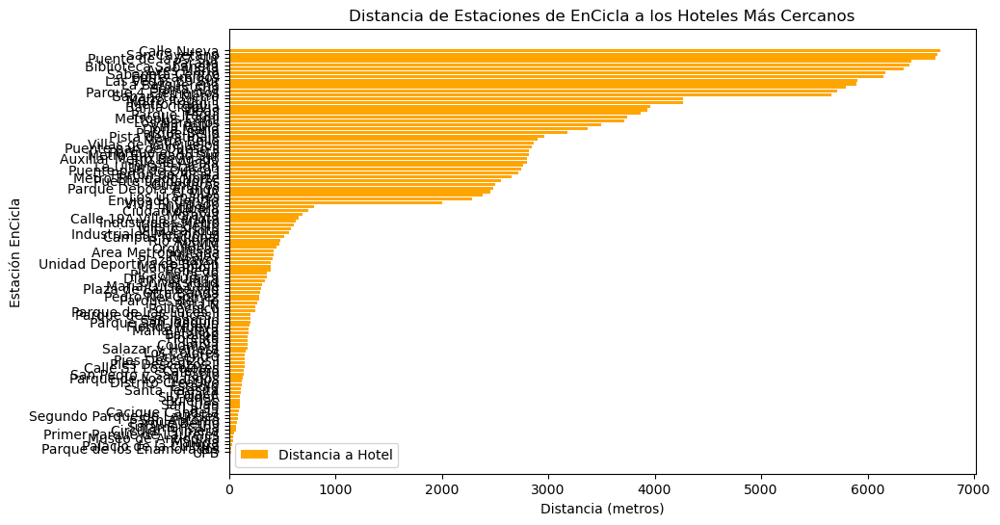

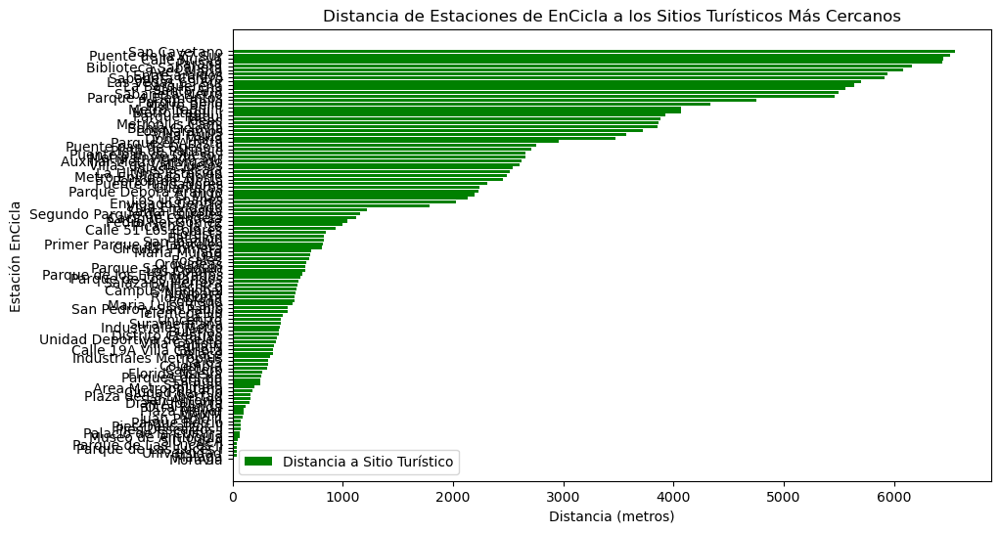

In [61]:
import matplotlib.pyplot as plt

# Ordenar el DataFrame por la distancia al hotel para una visualización ordenada
resultados_df_sorted = resultados_df.sort_values(by="distancia_hotel")

# Crear gráfico de barras para las distancias a los hoteles
plt.figure(figsize=(10, 6))
plt.barh(resultados_df_sorted['estacion'], resultados_df_sorted['distancia_hotel'], color='orange', label='Distancia a Hotel')
plt.xlabel("Distancia (metros)")
plt.ylabel("Estación EnCicla")
plt.title("Distancia de Estaciones de EnCicla a los Hoteles Más Cercanos")
plt.legend()
plt.show()

# Crear gráfico de barras para las distancias a los sitios turísticos
resultados_df_sorted = resultados_df.sort_values(by="distancia_sitio")
plt.figure(figsize=(10, 6))
plt.barh(resultados_df_sorted['estacion'], resultados_df_sorted['distancia_sitio'], color='green', label='Distancia a Sitio Turístico')
plt.xlabel("Distancia (metros)")
plt.ylabel("Estación EnCicla")
plt.title("Distancia de Estaciones de EnCicla a los Sitios Turísticos Más Cercanos")
plt.legend()
plt.show()


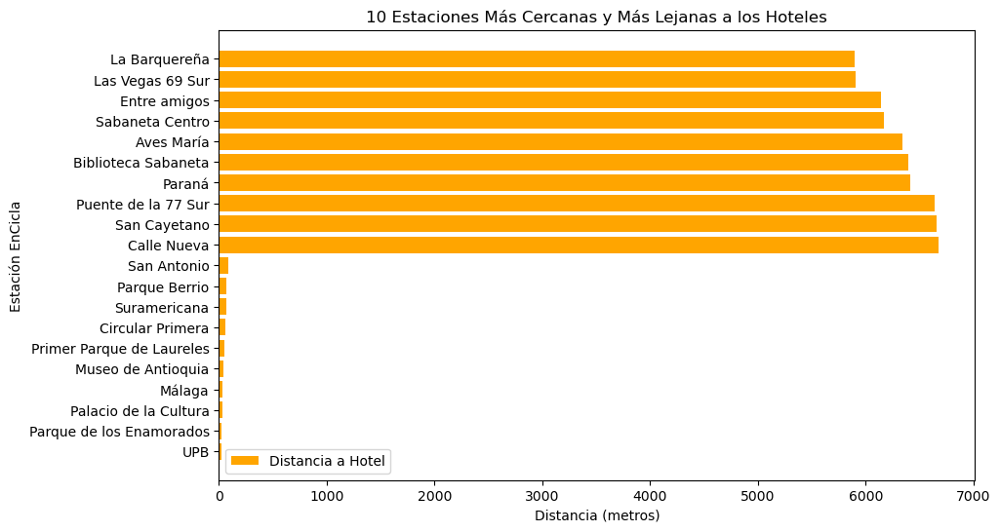

In [62]:
import matplotlib.pyplot as plt

# Filtrar las 10 estaciones más cercanas y más lejanas a los hoteles
top_10_cercanas = resultados_df.nsmallest(10, 'distancia_hotel')
top_10_lejanas = resultados_df.nlargest(10, 'distancia_hotel')
resultados_top = pd.concat([top_10_cercanas, top_10_lejanas])

# Crear gráfico de barras
plt.figure(figsize=(10, 6))
plt.barh(resultados_top['estacion'], resultados_top['distancia_hotel'], color='orange', label='Distancia a Hotel')
plt.xlabel("Distancia (metros)")
plt.ylabel("Estación EnCicla")
plt.title("10 Estaciones Más Cercanas y Más Lejanas a los Hoteles")
plt.legend()
plt.show()


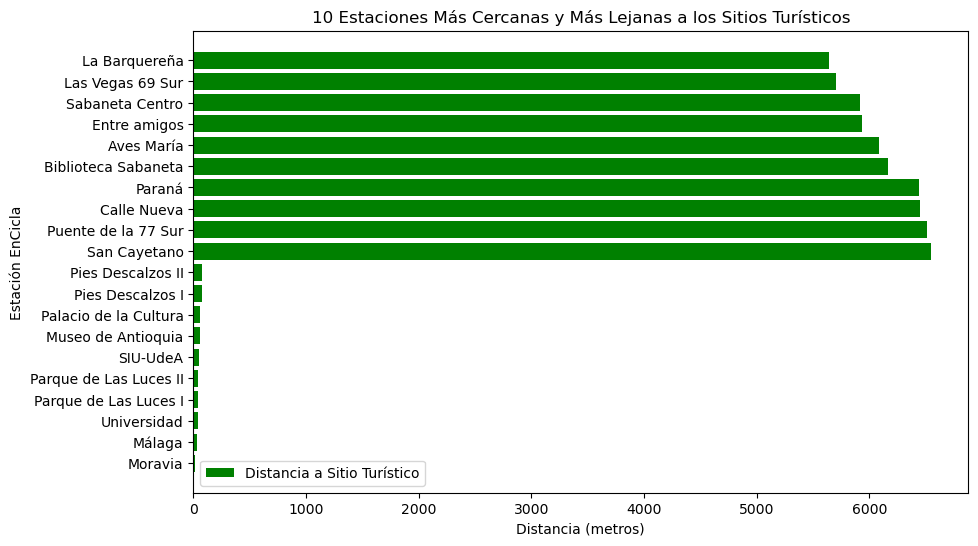

In [63]:
import matplotlib.pyplot as plt
import pandas as pd

# Filtrar las 10 estaciones más cercanas y más lejanas a los sitios turísticos
top_10_cercanas_sitios = resultados_df.nsmallest(10, 'distancia_sitio')
top_10_lejanas_sitios = resultados_df.nlargest(10, 'distancia_sitio')
resultados_top_sitios = pd.concat([top_10_cercanas_sitios, top_10_lejanas_sitios])

# Crear gráfico de barras
plt.figure(figsize=(10, 6))
plt.barh(resultados_top_sitios['estacion'], resultados_top_sitios['distancia_sitio'], color='green', label='Distancia a Sitio Turístico')
plt.xlabel("Distancia (metros)")
plt.ylabel("Estación EnCicla")
plt.title("10 Estaciones Más Cercanas y Más Lejanas a los Sitios Turísticos")
plt.legend()
plt.show()


In [64]:
import folium
from folium.plugins import MarkerCluster

# Convertir los datos a EPSG:4326 para usarlos en folium
estaciones_nombre = estaciones_nombre.to_crs(epsg=4326)
hoteles = hoteles.to_crs(epsg=4326)
turisticos = turisticos.to_crs(epsg=4326)

# Crear un mapa centrado
centro_mapa = [estaciones_nombre.geometry.y.mean(), estaciones_nombre.geometry.x.mean()]
mapa_proximidad = folium.Map(location=centro_mapa, zoom_start=12)

# Crear un grupo de marcadores
marker_cluster = MarkerCluster().add_to(mapa_proximidad)

# Añadir las estaciones de EnCicla, hoteles y sitios turísticos con líneas de conexión
for _, row in resultados_df.iterrows():
    estacion = estaciones_nombre[estaciones_nombre['NOMBRE ESTACION'] == row['estacion']].iloc[0]
    hotel = hoteles[hoteles['Nombre *'] == row['hotel_mas_cercano']].iloc[0]
    sitio = turisticos[turisticos['nombre_sitio'] == row['sitio_mas_cercano']].iloc[0]
    
    # Marcar la estación
    folium.Marker(
        location=[estacion.geometry.y, estacion.geometry.x],
        popup=row['estacion'],
        tooltip="Estación EnCicla",
        icon=folium.Icon(color="blue", icon="bicycle")
    ).add_to(marker_cluster)
    
    # Marcar el hotel más cercano
    folium.Marker(
        location=[hotel.geometry.y, hotel.geometry.x],
        popup=row['hotel_mas_cercano'],
        tooltip="Hotel más cercano",
        icon=folium.Icon(color="orange", icon="bed")
    ).add_to(marker_cluster)
    
    # Marcar el sitio turístico más cercano
    folium.Marker(
        location=[sitio.geometry.y, sitio.geometry.x],
        popup=row['sitio_mas_cercano'],
        tooltip="Sitio turístico más cercano",
        icon=folium.Icon(color="green", icon="info-sign")
    ).add_to(marker_cluster)
    
    # Dibujar línea entre estación y hotel
    folium.PolyLine(
        [[estacion.geometry.y, estacion.geometry.x], [hotel.geometry.y, hotel.geometry.x]],
        color="orange", weight=2.5, opacity=0.7
    ).add_to(mapa_proximidad)
    
    # Dibujar línea entre estación y sitio turístico
    folium.PolyLine(
        [[estacion.geometry.y, estacion.geometry.x], [sitio.geometry.y, sitio.geometry.x]],
        color="green", weight=2.5, opacity=0.7
    ).add_to(mapa_proximidad)

# Mostrar el mapa
mapa_proximidad


In [8]:
print("Hola mundo")

Hola mundo
